In [ ]:
from google.colab import drive
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from skimage.io import imread, imshow
import skimage.io as skio
from skimage import img_as_ubyte, img_as_float
import cv2
import glob
import scipy.io
import random
import math
from random import randint
from skimage.future import graph
from skimage import data, segmentation, color, filters, io
from PIL import Image
from os import listdir
from os import path
from PIL import Image as PImage
from PIL import ImageColor as PColor
from random import randint
from copy import deepcopy
from sklearn.metrics.cluster import contingency_matrix
from sklearn.metrics.pairwise import rbf_kernel as rbf
from collections import Counter
import sys
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.metrics import f1_score

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path = "/content/drive/MyDrive/Img_Seg/data/images/test/"
filenames = glob.glob(f"{path}*.jpg")
filenames.sort()
images = []
for i in filenames:
  images.append(cv2.imread(i))
images =images[:50]

Ground Truth Segmentation

In [ ]:
filenames = glob.glob("/content/drive/MyDrive/Img_Seg/data/groundTruth/test/*.mat")
filenames.sort()
matrices = []
for mat in filenames:
  matrices.append(scipy.io.loadmat(mat))
matrices = matrices[:50]

Visulaize Image

In [ ]:
def displayImage(img_index):
    f, axis_array = plt.subplots(1,6,figsize=(50,50))
    chosen_img = images[img_index]
    height,width,z  = chosen_img.shape
    axis_array[0].imshow(chosen_img)

    for i in range(5):
      edge_data = matrices[img_index]['groundTruth'][0][i][0][0][1]
      axis_array[i+1].matshow(cv2.resize(edge_data, dsize=(width, height), interpolation=cv2.INTER_CUBIC), cmap = 'binary')
    plt.figure(figsize=(60, 60))  
    plt.show


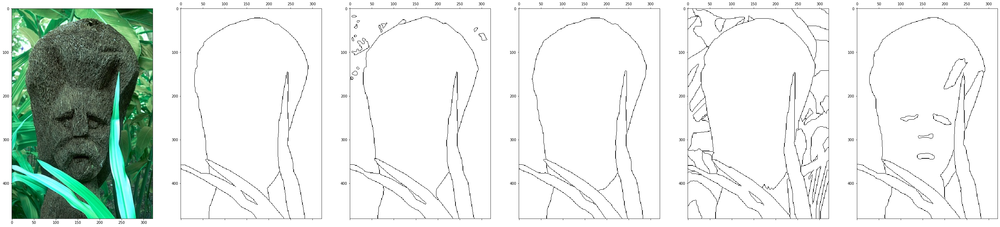

<Figure size 4320x4320 with 0 Axes>

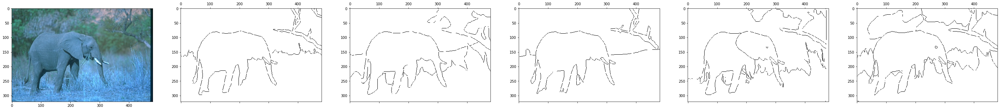

<Figure size 4320x4320 with 0 Axes>

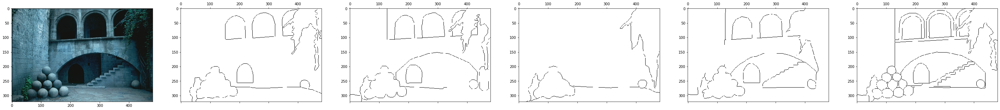

<Figure size 4320x4320 with 0 Axes>

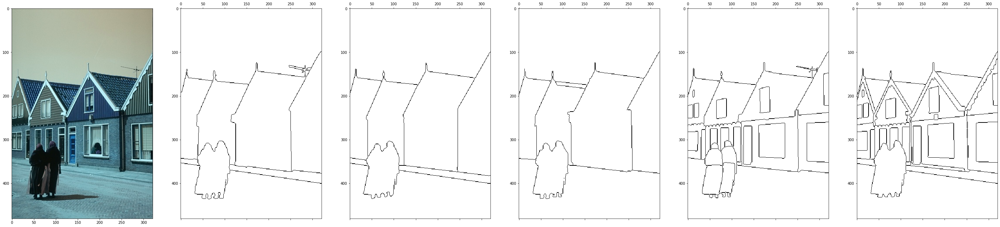

<Figure size 4320x4320 with 0 Axes>

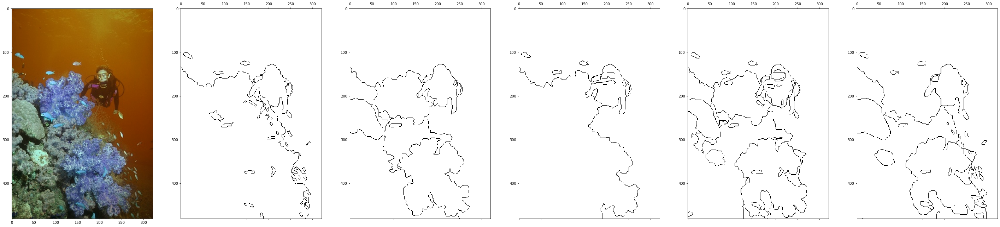

<Figure size 4320x4320 with 0 Axes>

In [ ]:
pictures = [5,15,27,36,49]
for pic in pictures:
    displayImage(pic)


K-Means

## Segmentation using K-Means

In [ ]:
def Kmeans(data, num_clusters = 2, tolerance=0.0001, max_iter = 300, CIELAB = False):
    iter_num = 0
    n = data.shape[0] # 154401
    c = data.shape[1] # 3

    mean = np.mean(data, axis = 0) # 154401
    std = np.std(data, axis = 0)
    centroids = np.random.randn(num_clusters,c)*std + mean # 2 x 3
        
    old_centroids = np.zeros(centroids.shape)  # 2 x 3
    new_centroids = deepcopy(centroids)  # 2 x 3
    error = np.linalg.norm(new_centroids - old_centroids)
    clusters = np.zeros(n) # 154401
    distances = np.zeros((n,num_clusters)) # 154401 x 2
    while error > tolerance and iter_num < max_iter:
        iter_num += 1
        for i in range(num_clusters):
            distances[:,i] = np.linalg.norm(data - new_centroids[i], axis=1)
        clusters = np.argmin(distances, axis = 1)
        old_centroids = deepcopy(new_centroids)
        for i in range(num_clusters):
            if not data[clusters == i].any():
                new_centroids[i] = np.random.randn(1,c)*std + mean
                continue
            new_centroids[i] = np.mean(data[clusters == i], axis=0)
        error = np.linalg.norm(new_centroids - old_centroids)
        if iter_num == 2 :
          break
        
    return new_centroids,clusters,error,iter_num

In [ ]:
colors = [[255,0,0],[0, 255, 0],[0, 0, 255],[204, 0, 204],[255, 255, 102]
          ,[0, 102, 0],[0,0,102],[0,51,0],
        [102,0,51],[175,175,175],[51,0,0]]
colors=np.array(colors)

In [ ]:
def colorImage(image, clusters, num_clusters):
  for i in range(len(colors),num_clusters):
    colors.append(np.array([randint(0, 255),randint(0, 255),randint(0, 255)]))
  for i in range(len(clusters)):
      image[i] = colors[clusters[i]]
  return image.reshape(321,481,3).astype('uint8')


In [ ]:
flat = np.zeros(154401*3*200).reshape(200,154401,3)
for i in range(len(images)):
  flat[i] = images[i].flatten().reshape(-1,3)


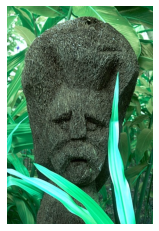

In [ ]:
plt.axis('off');
plt.imshow(flat[5].reshape(481,321,3).astype('uint8'))

In [ ]:
K = [3,5,7,9,11]
clustered_images = []
clustered_colored_images = []
ImageNumbers = [5,15,27,36,49]
for i in ImageNumbers:
  for k in K:
    centers, clusters, err, itr = Kmeans(flat[i], num_clusters = k)
    clustered_images.append(clusters)
    clustered_colored_images.append(colorImage(deepcopy(flat[i]), clusters, k))

## Evaluation

We will evaluate the result segmentation using F-measure, Conditional Entropy for image I with M available ground-truth segmentations. For a clustering of K-clusters you will report your measures M times and the average of the M trials as well.

### F-Measure

In [ ]:
Label = []
Labels = []
for img_num in ImageNumbers:
  Label = []
  for i in range(matrices[img_num]['groundTruth'][0].shape[0]):
    Label.append(matrices[img_num]["groundTruth"][0][i][0][0][0].flatten())
  Labels.append(Label)

In [ ]:
clusters_evaluation = []
for i in range(0, 25, 5):
  clusters_evaluation.append(clustered_images[i:i+5])

In [ ]:
max(Labels[0][0])

9

In [ ]:
ContingencyMatrix = contingency_matrix(Labels[0][0], clusters_evaluation[0][0]).T
print(ContingencyMatrix)

[[ 7417   774  7553  8313    10  1011    13     2     0]
 [26868 52006    86    59   517  5142  2646  3826   188]
 [17929 17722   359   443    29   828   174   420    66]]


In [ ]:
clusters_sum = np.sum(ContingencyMatrix, axis = 1) # clusters in kmeans
groundtruth_sum = np.sum(ContingencyMatrix, axis = 0) # clusters in groundtruth


In [ ]:
TruePos = 0
FalsePos = 0
FalseNeg = 0
for cluster in ContingencyMatrix:
  TruePos += max(cluster)
  FalsePos += np.sum(cluster) - max(cluster)
  FalseNeg += groundtruth_sum[np.argmax(cluster)] - max(cluster)

Precision = TruePos / (TruePos + FalsePos)
Recall = TruePos / (TruePos + FalseNeg)
print("Precision : " , Precision)
print("Recall : " ,Recall)

f_measure = (2 * Precision * Recall) / (Precision + Recall)
print(f_measure)

Precision :  0.5067842824852171
Recall :  0.5949015821365305
0.5473189429654604


In [ ]:
def CalculateFMeasure(groundTruthLabels, clusterEvaluation):
  

  FMeasures = []

  for i in range(len(clusterEvaluation)):
    num_groundtruths = len(groundTruthLabels[i])
    num_clusterings_K = len(clusterEvaluation[i])
    FMeasure = []

    for clustering in clusterEvaluation[i]:
      F = []
      
      for groundtruth in groundTruthLabels[i]:

        ContingencyMatrix = contingency_matrix(groundtruth, clustering).T
        clusters_sum = np.sum(ContingencyMatrix, axis = 1) # clusters in kmeans
        groundtruth_sum = np.sum(ContingencyMatrix, axis = 0) # clusters in groundtruth

        TruePos = 0
        FalsePos = 0
        FalseNeg = 0
        for cluster in ContingencyMatrix:
            TruePos += max(cluster)
            FalsePos += np.sum(cluster) - max(cluster)
            FalseNeg += groundtruth_sum[np.argmax(cluster)] - max(cluster)

        Precision = TruePos / (TruePos + FalsePos)
        Recall = TruePos / (TruePos + FalseNeg)
        F.append((2 * Precision * Recall) / (Precision + Recall))
      FMeasure.append(F)
    FMeasures.append(FMeasure)
  return FMeasures

In [ ]:
def ClusterEvaluation():
  clusters_evaluation = []
  for i in range(0, 25, 5):
    clusters_evaluation.append(clustered_images[i:i+5])
  return clusters_evaluation

In [ ]:
def GroundTruthLabels(img_nums):
  groundTruth_label = []
  groundTruth_labels = []

  for img_num in img_nums:
    groundTruth_label = []
    for i in range(matrices[img_num]['groundTruth'][0].shape[0]):
      groundTruth_label.append(matrices[img_num]["groundTruth"][0][i][0][0][0].flatten())
    groundTruth_labels.append(groundTruth_label)
  return groundTruth_labels

In [ ]:
def FMeasure(groundTruthLabels, clusterEvaluation):

  fmeasures = CalculateFMeasure(groundTruthLabels, clusters_evaluation)
  Ks = [3, 5 ,7, 9, 11]
  Averages = []
  MaxS = []
  for i in range(len(fmeasures)):
    Average = []
    Max = []
    print(f"F-Measures Image {i+1}")
    for k in range(len(fmeasures[i])):
      f = []
      for j in range(len(fmeasures[i][k])):
        f.append(fmeasures[i][k][j])
        print(f"K = {Ks[k]} Clusters, Ground Truth: {j+1}, F-Measure = {fmeasures[i][k][j]} ")
      Average.append(sum(f)/len(f))
      Max.append(max(f))
      print("_______________________________________________________")
      print(f"K = {Ks[k]}, Average F-Measure = {Average[k]}")
      print(f"K = {Ks[k]}, Max F-Measure = {Max[k]}")
      print("_______________________________________________________")
    Averages.append(sum(Average)/len(Average))
    MaxS.append(max(Max))
    print(f"Image {i+1}, Overall Average F-Measure = {Averages[i]}")
    print(f"Image {i+1}, Overall Max F-Measure = {MaxS[i]}")
    print("_______________________________________________________")
    for i in range(len(Averages)):
      print(f"Image {i+1}, Overall Average F-Measure = {Averages[i]}")
      print(f"Image {i+1}, Overall Max F-Measure = {MaxS[i]}")
    print("_______________________________________________________")
   

  return Averages

In [ ]:
clusterEvaluation = ClusterEvaluation()
groundTruthLabels = GroundTruthLabels(ImageNumbers)
FAverages = FMeasure(groundTruthLabels, clusterEvaluation)

F-Measures Image 1
K = 3 Clusters, Ground Truth: 1, F-Measure = 0.5473189429654604 
K = 3 Clusters, Ground Truth: 2, F-Measure = 0.5130818245650876 
K = 3 Clusters, Ground Truth: 3, F-Measure = 0.5421508720083393 
K = 3 Clusters, Ground Truth: 4, F-Measure = 0.5120426199177257 
K = 3 Clusters, Ground Truth: 5, F-Measure = 0.5164384245944807 
K = 3 Clusters, Ground Truth: 6, F-Measure = 0.5072987378022911 
_______________________________________________________
K = 3, Average F-Measure = 0.5230552369755642
K = 3, Max F-Measure = 0.5473189429654604
_______________________________________________________
K = 5 Clusters, Ground Truth: 1, F-Measure = 0.4199304750869061 
K = 5 Clusters, Ground Truth: 2, F-Measure = 0.41621155013119326 
K = 5 Clusters, Ground Truth: 3, F-Measure = 0.4198640780014685 
K = 5 Clusters, Ground Truth: 4, F-Measure = 0.4102665464914639 
K = 5 Clusters, Ground Truth: 5, F-Measure = 0.4102025552719306 
K = 5 Clusters, Ground Truth: 6, F-Measure = 0.41425228008127957 

In [ ]:
def CalculateConditionalEntropy(groundTruthLabels, clusterEvaluation):


  num_images = len(clusterEvaluation) 
  conditinalEntropiesImages = []
  for i in range(num_images):
    num_groundtruths = len(groundTruthLabels[i])
    num_clusterings_K = len(clusterEvaluation[i])
    conditinalEntropies = []
    for clustering in clusterEvaluation[i]:
      conditinalEntropy = []
      for groundtruth in groundTruthLabels[i]:
        h_t_ci = []
        per_cluster = []

        

        ContingencyMatrix = contingency_matrix(groundtruth, clustering).T
        clusters_sum = np.sum(ContingencyMatrix, axis = 1) # clusters in kmeans
        groundtruth_sum = np.sum(ContingencyMatrix, axis = 0) # clusters in groundtruth

        for cluster in ContingencyMatrix:
          per_cluster.append(sum(cluster)/sum(clusters_sum))
          entropy = 0
          for val in cluster:
            if val==0:
              continue
            entropy += - (val/sum(cluster)) * (np.log2(val/sum(cluster)))
          h_t_ci.append(entropy)

        h_t_c = 0
        for j in range(len(h_t_ci)):
          h_t_c += per_cluster[j] * h_t_ci[j]
        conditinalEntropy.append(h_t_c)
      conditinalEntropies.append(conditinalEntropy)
    conditinalEntropiesImages.append(conditinalEntropies)
  return conditinalEntropiesImages

In [ ]:
def ConditionalEntropy(groundTruthLabels, clusterEvaluation):
  conditinalEntropies = CalculateConditionalEntropy(groundTruthLabels, clusterEvaluation)
  Ks = [3, 5 ,7, 9, 11]
  Averages = []
  MaxS = []
  for i in range(len(conditinalEntropies)):
    Average = []
    Max = []
    print(f"Conditional Entropy Image {i+1}")

    for k in range(len(conditinalEntropies[i])):
      F = []
      for j in range(len(conditinalEntropies[i][k])):
        F.append(conditinalEntropies[i][k][j])
        print(f"K = {Ks[k]} Clusters with Ground Truth: {j+1}, Conditional Entropy = {conditinalEntropies[i][k][j]} ")
      Average.append(sum(F)/len(F))
      Max.append(max(F))
      print("_______________________________________________________")
      print(f"K = {Ks[k]}, Average Conditional Entropy = {Average[k]}")
      print(f"K = {Ks[k]}, Max Conditional Entropy = {Max[k]}")
    Averages.append(sum(Average)/len(Average))
    MaxS.append(max(Max))
    print("_______________________________________________________")
    print(f"Image {i+1}, Overall Average Conditional Entropy = {Averages[i]}")
    print(f"Image {i+1}, Max Average Conditional Entropy = {MaxS[i]}")
    print("_______________________________________________________")
  for i in range(len(Averages)):
    print(f"Image {i+1}, Overall Average Conditional Entropy = {Averages[i]}")
    print(f"Image {i+1}, Max Average Conditional Entropy = {MaxS[i]}")
  print("_______________________________________________________")


  return Averages

In [ ]:
clusterEvaluation = ClusterEvaluation()
groundTruthLabels = GroundTruthLabels(ImageNumbers)
conditional_entropy_averages = ConditionalEntropy(groundTruthLabels, clusterEvaluation)

Conditional Entropy Image 1
K = 3 Clusters with Ground Truth: 1, Conditional Entropy = 1.6257810201396647 
K = 3 Clusters with Ground Truth: 2, Conditional Entropy = 1.687441916000388 
K = 3 Clusters with Ground Truth: 3, Conditional Entropy = 1.7081374906604916 
K = 3 Clusters with Ground Truth: 4, Conditional Entropy = 2.958131262279387 
K = 3 Clusters with Ground Truth: 5, Conditional Entropy = 1.8797061637888697 
K = 3 Clusters with Ground Truth: 6, Conditional Entropy = 2.1699891867132237 
_______________________________________________________
K = 3, Average Conditional Entropy = 2.0048645065970043
K = 3, Max Conditional Entropy = 2.958131262279387
K = 5 Clusters with Ground Truth: 1, Conditional Entropy = 1.4758730928475017 
K = 5 Clusters with Ground Truth: 2, Conditional Entropy = 1.5519938951055807 
K = 5 Clusters with Ground Truth: 3, Conditional Entropy = 1.5544764229422092 
K = 5 Clusters with Ground Truth: 4, Conditional Entropy = 2.744045493842325 
K = 5 Clusters with Gr

### Select 5 Images




 Original Image


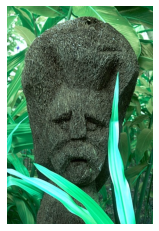

Clusters at K = 3
Counter({1: 91338, 2: 37970, 0: 25093})


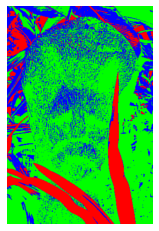

1
Clusters at K = 5
Counter({2: 48000, 1: 46709, 0: 39454, 3: 16828, 4: 3410})


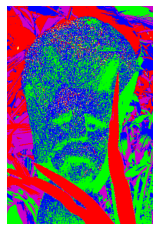

2
Clusters at K = 7
Counter({3: 92309, 5: 22609, 0: 14002, 2: 9907, 1: 8386, 6: 7187, 4: 1})


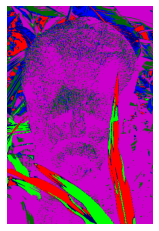

3
Clusters at K = 9
Counter({0: 34965, 5: 31474, 2: 21571, 3: 19849, 6: 14500, 4: 13257, 1: 13101, 8: 4156, 7: 1528})


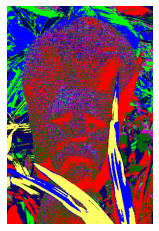

4
Clusters at K = 11
Counter({2: 68587, 10: 22026, 8: 14518, 3: 10676, 9: 10520, 1: 10005, 0: 6486, 7: 6399, 4: 3738, 5: 1446})


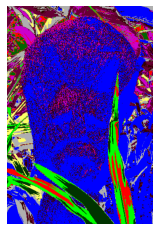

5
Ground Truth


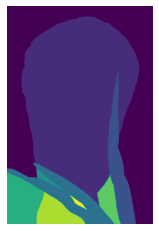

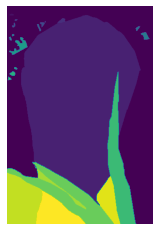

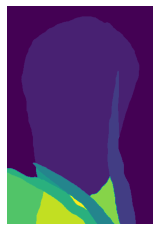

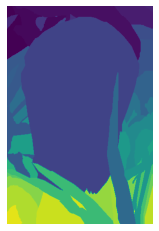

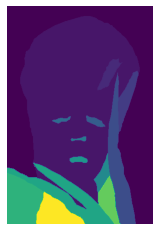

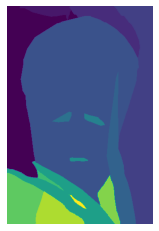




 Original Image


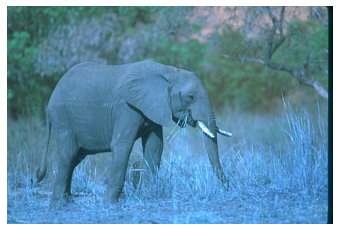

Clusters at K = 3
Counter({1: 117494, 2: 20589, 0: 16318})


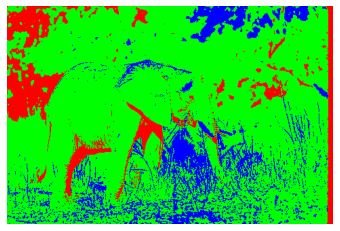

6
Clusters at K = 5
Counter({3: 53149, 2: 44034, 1: 28650, 0: 19027, 4: 9541})


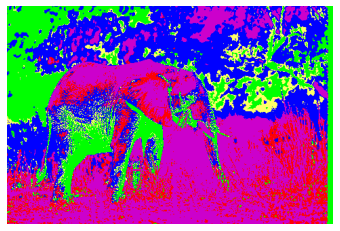

7
Clusters at K = 7
Counter({6: 37998, 1: 30908, 5: 28572, 4: 20267, 2: 16236, 0: 12411, 3: 8009})


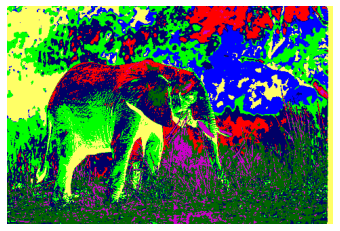

8
Clusters at K = 9
Counter({6: 35978, 1: 34059, 5: 19142, 4: 17650, 3: 15359, 0: 14476, 7: 10229, 8: 5857, 2: 1651})


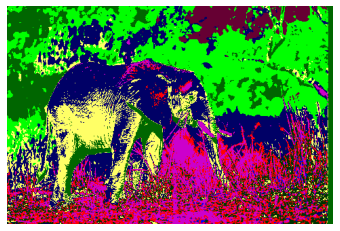

9
Clusters at K = 11
Counter({9: 40535, 0: 24068, 2: 22375, 6: 14670, 4: 14550, 10: 13596, 3: 11491, 5: 8949, 8: 3803, 7: 364})


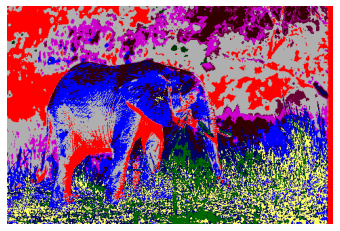

10
Ground Truth


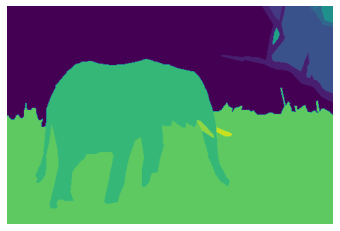

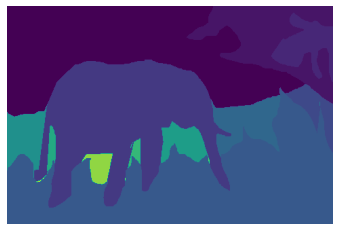

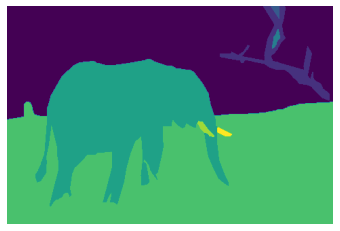

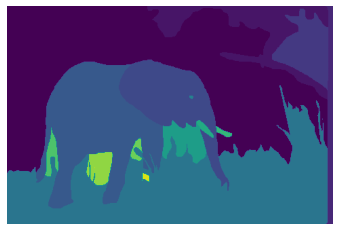

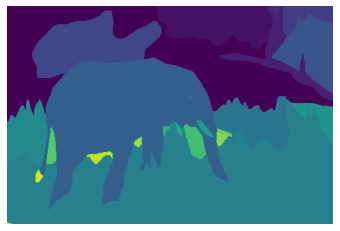




 Original Image


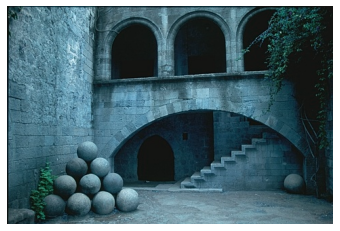

Clusters at K = 3
Counter({2: 79780, 0: 49916, 1: 24705})


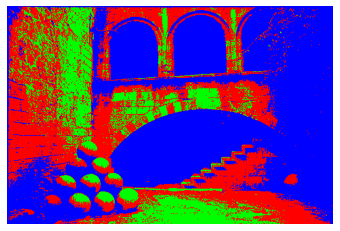

11
Clusters at K = 5
Counter({1: 61676, 0: 33286, 4: 29821, 3: 29618})


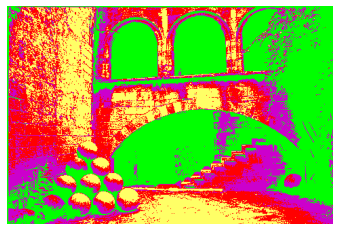

12
Clusters at K = 7
Counter({5: 67226, 4: 53435, 3: 33711, 2: 29})


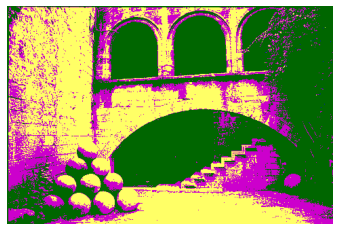

13
Clusters at K = 9
Counter({0: 41546, 6: 32698, 3: 29704, 2: 24084, 1: 14874, 7: 11495})


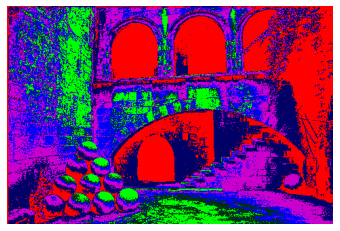

14
Clusters at K = 11
Counter({0: 40743, 6: 26383, 10: 26285, 8: 23104, 9: 17741, 3: 15264, 7: 4618, 1: 263})


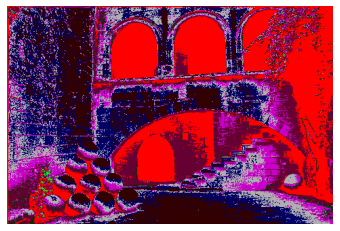

15
Ground Truth


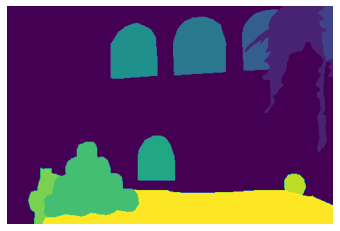

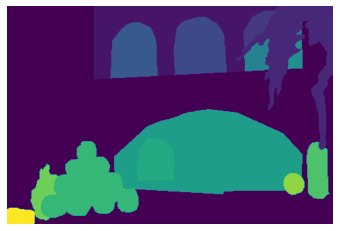

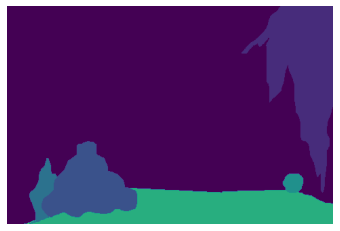

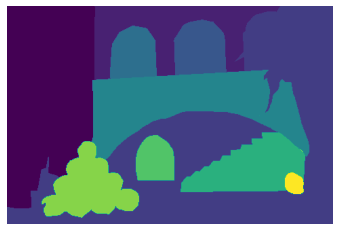

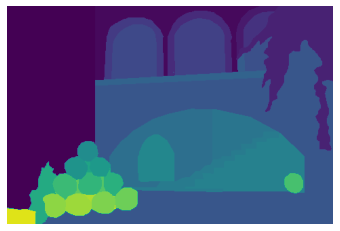

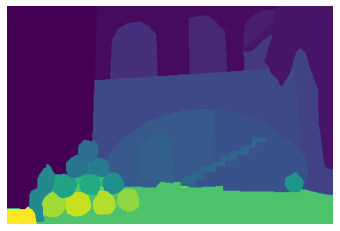




 Original Image


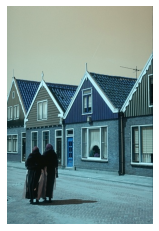

Clusters at K = 3
Counter({0: 117094, 2: 37093, 1: 214})


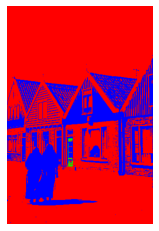

16
Clusters at K = 5
Counter({0: 59925, 2: 29323, 4: 24975, 3: 21528, 1: 18650})


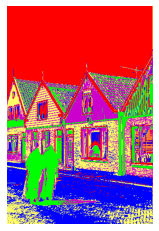

17
Clusters at K = 7
Counter({4: 50281, 6: 46849, 1: 21853, 5: 20789, 0: 10058, 3: 4571})


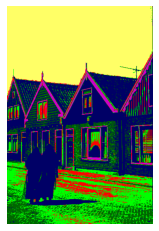

18
Clusters at K = 9
Counter({8: 53158, 4: 32812, 0: 31272, 6: 26742, 2: 10403, 3: 14})


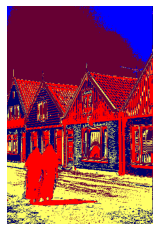

19
Clusters at K = 11
Counter({7: 54319, 8: 37024, 1: 32521, 3: 21102, 0: 6501, 4: 2307, 10: 478, 9: 126, 2: 23})


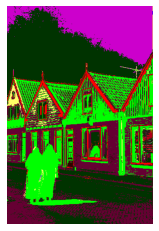

20
Ground Truth


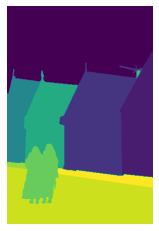

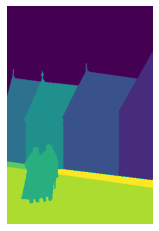

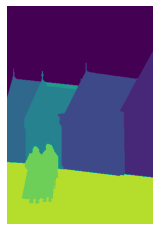

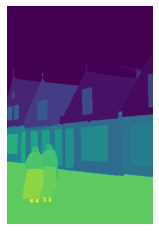

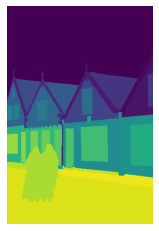

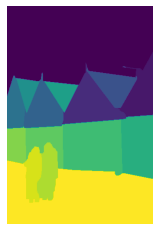




 Original Image


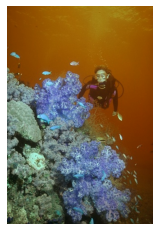

Clusters at K = 3
Counter({0: 80241, 1: 44486, 2: 29674})


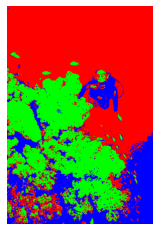

21
Clusters at K = 5
Counter({4: 67722, 2: 30684, 0: 29730, 3: 19137, 1: 7128})


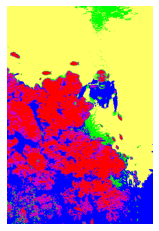

22
Clusters at K = 7
Counter({3: 51952, 2: 25796, 1: 22559, 4: 19891, 0: 17789, 6: 8916, 5: 7498})


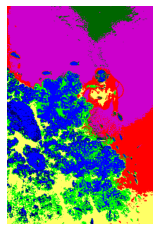

23
Clusters at K = 9
Counter({7: 30611, 2: 25311, 6: 25028, 0: 20177, 4: 15682, 8: 14086, 3: 12613, 5: 10892, 1: 1})


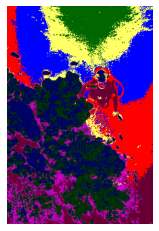

24
Clusters at K = 11
Counter({0: 30750, 7: 24866, 8: 21205, 3: 18074, 1: 16380, 2: 15374, 10: 13149, 4: 7943, 6: 3515, 9: 2355, 5: 790})


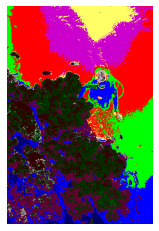

25
Ground Truth


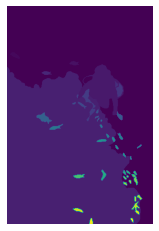

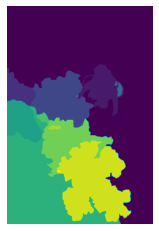

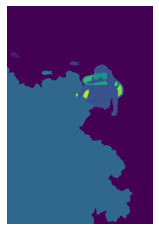

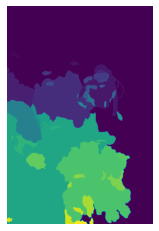

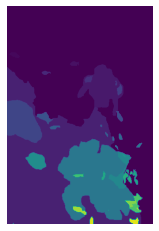

In [ ]:
count = 0
for img in ImageNumbers:
    print("\n\n\n Original Image")
    plt.imshow(images[img])
    plt.axis('off');
    plt.show()

    if images[img].shape[0]==481:
      for k in K:
          print(f"Clusters at K = {k}")
          print(Counter(clustered_images[count]))
          plt.imshow(clustered_colored_images[count].reshape(481,321,3).astype('uint8'))
          plt.axis('off');
          plt.show()
          count += 1
          print(count)
    else:
         for k in K:
          print(f"Clusters at K = {k}")
          print(Counter(clustered_images[count]))
          plt.imshow(clustered_colored_images[count].reshape(321,481,3).astype('uint8'))
          plt.axis('off');
          plt.show()
          count += 1
          print(count)

    print("Ground Truth")
    for i in range(matrices[img]['groundTruth'][0].shape[0]):
        plt.axis('off');
        plt.imshow(matrices[img]['groundTruth'][0][i][0][0][0])
        plt.show()

## Normalized Cut
* Select the same five images and display their corresponding ground 
truth against your segmentation results using Normalized-cut for the 
5-NN graph, at K=5. Comment on the results.

* Select the same five images and contrast your segmentation results 
using Normalized-cut for the 5-NN graph, at K=5 versus using Kmeans at K=5. Comment on the results

In [ ]:
import cv2
from sklearn.cluster import KMeans

def normalizedCut(img,num_clusters):

  img = cv2.resize(img,(100,100))
  img = np.array(img)
  img = img.reshape(-1,3)
  sim_mat = rbf(img)

  d = np.sum(sim_mat,axis =1)
  d = np.diag(d)
  L = d - sim_mat
  La = np.dot(np.linalg.inv(d),L)

  eigen_values,eigen_vectors = np.linalg.eig(La)
  eigen_values = np.real(eigen_values)
  eigen_vectors = np.real(eigen_vectors)
  idx = eigen_values.argsort()
  eigen_values = eigen_values[idx]
  eigen_vectors = eigen_vectors[:,idx]

  U = eigen_vectors[:,:150]
  Y = np.zeros(U.shape)
  norms = np.linalg.norm(U,axis = 1)
  for row in range(100*100):
    Y[row] = U[row] / norms[row]

  clusters = KMeans(5).fit_predict(Y)
  result = clusters.reshape((100,100))
  return result

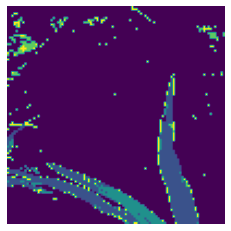

In [ ]:
n_cut_results = []
# for i in range(0,5):
res = normalizedCut(images[ImageNumbers[0]],5)
n_cut_results.append(res)
plt.imshow(res);
plt.axis('off');
plt.show()

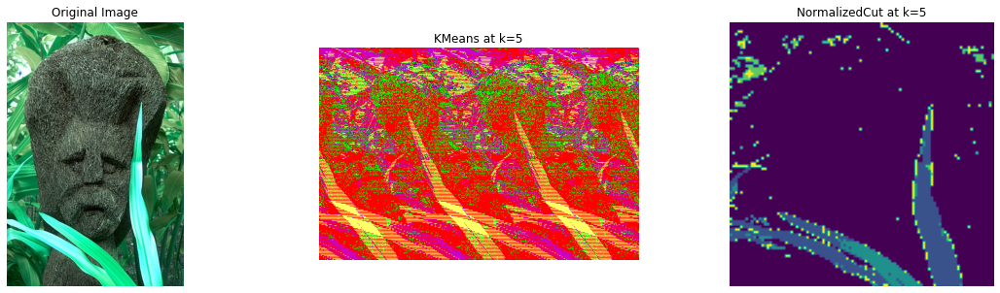

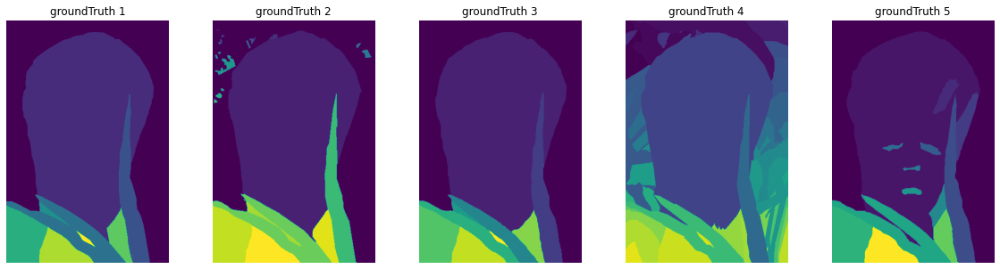

In [ ]:
# for i in range(5):
fig, axs = plt.subplots(1,3, figsize=(20,5))
fig, axs2 = plt.subplots(1,5, figsize=(20,5))
axs[0].axis('off')
axs[0].imshow(images[ImageNumbers[0]])
axs[0].set_title("Original Image")
axs[1].axis('off')
axs[1].imshow(clustered_colored_images[(0*5)+1].reshape(481,321,3).astype('uint8'))
axs[1].set_title("KMeans at k=5")
axs[2].axis('off')
axs[2].imshow(n_cut_results[0])
axs[2].set_title("NormalizedCut at k=5")
for j in range(0, 5) :
  axs2[j].axis('off')
  axs2[j].imshow(matrices[ImageNumbers[0]]['groundTruth'][0][j][0][0][0])
  axs2[j].set_title("groundTruth "+ str(j+1))

## Spatial Layout


*   In the previous parts, we used the color features RGB. We did not encode the layout of the pixels. We want to modify that for K-means clustering to encode the spatial layout of the pixels.
*   Modify the feature vector to include spatial layout.



In [ ]:
image_xy = []
images_xy = []
for img_num in ImageNumbers:
  image_xy = []
  for i in range(images[img_num].shape[0]):
    pixel_row = []
    for j in range(images[img_num].shape[1]):
      pixel = [i//15, j//15, images[img_num][i][j][0], images[img_num][i][j][1], images[img_num][i][j][2]]
      pixel_row.append(pixel)
    image_xy.append(pixel_row)
  images_xy.append(image_xy)
images_xy = np.array(images_xy)

<ipython-input-31-999406a676e4>:12: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  images_xy = np.array(images_xy)


In [ ]:
type(images_xy[0])

list

In [ ]:
flat_xy = np.zeros(154401*5*5).reshape(5,154401,5)
for i in range(5):
  fxy = np.array(images_xy[i])
  flat_xy[i] = fxy.flatten().reshape(-1,5)

In [ ]:
K = [3,5,7,9,11]
clustered_images_xy = []
clustered_colored_image_xy = []
clustered_colored_images_xy = []

for i in range(5):
  # image_nums.append(i)
  clustered_colored_image_xy = []
  for k in K:
    centers, clusters, err, itr = Kmeans(flat_xy[i], num_clusters = k)
    clustered_images_xy.append(clusters)
    clustered_colored_image_xy.append(colorImage(deepcopy(flat[i*5]), clusters, k))
  clustered_colored_images_xy.append(clustered_colored_image_xy)

In [ ]:
clustered_without_spatial = []
for i in range(0, 25, 5):
  clustered_without_spatial.append(clustered_colored_images[i:i+5])

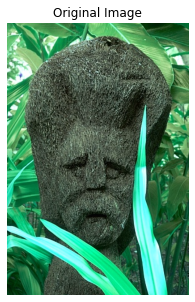

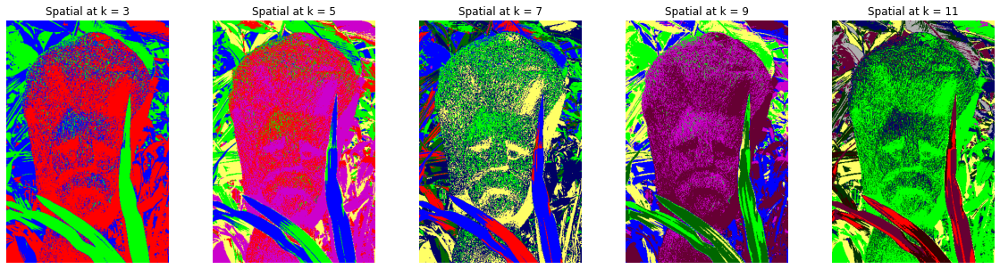

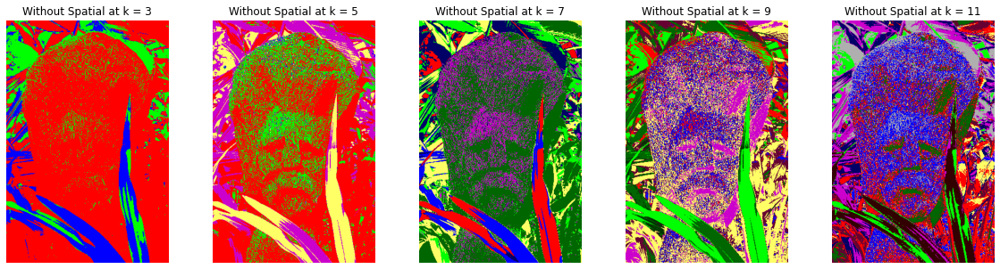

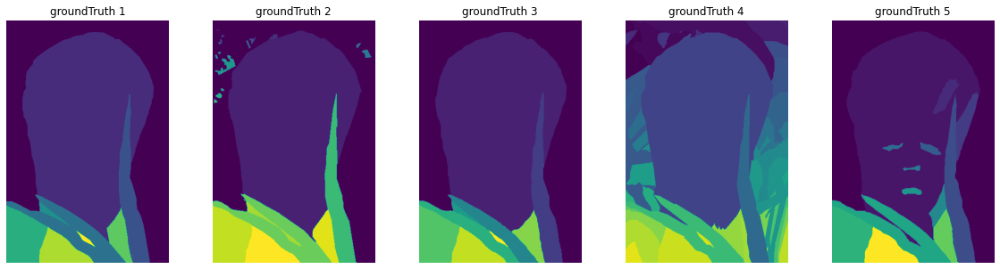

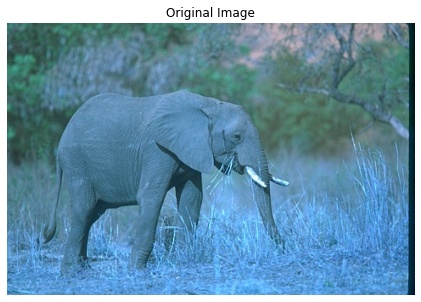

...

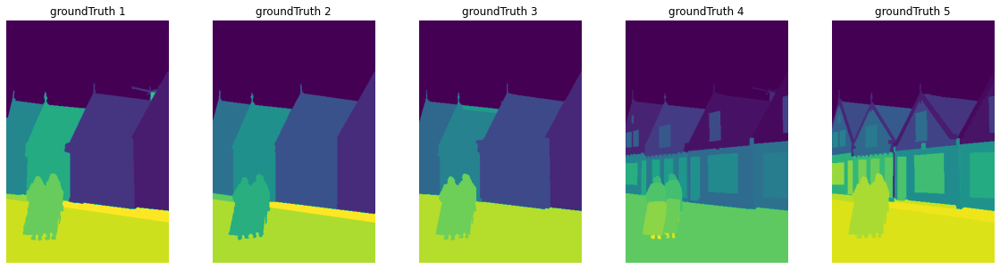

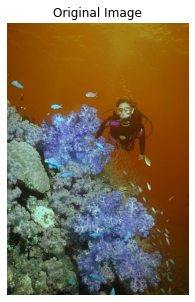

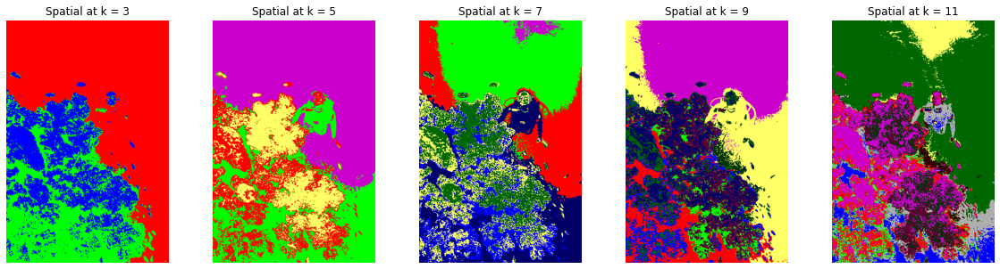

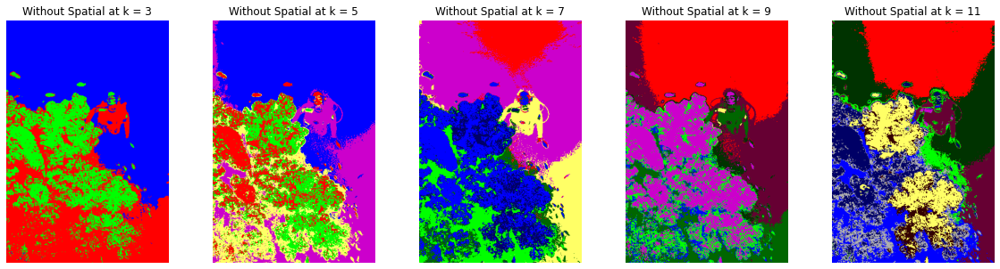

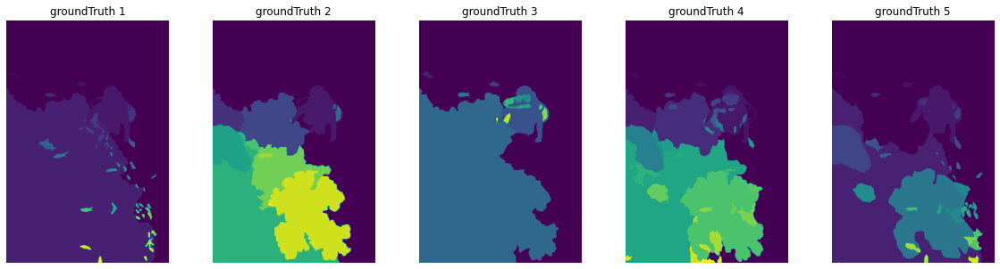

In [ ]:
for i in range(5):
  fig, axs = plt.subplots(figsize=(20,5))
  axs.axis('off')
  axs.imshow(images[ImageNumbers[i]])
  axs.set_title("Original Image")

  fig, axs1 = plt.subplots(1,5, figsize=(20,5))
  fig, axs2 = plt.subplots(1,5, figsize=(20,5))
  fig, axs3 = plt.subplots(1,5, figsize=(20,5))

  if images[ImageNumbers[i]].shape[0]==481:
   
    for j in range(5):
      axs1[j].axis('off')
      axs1[j].imshow(clustered_colored_images_xy[i][j].reshape(481,321,3).astype('uint8'))
      axs1[j].set_title(f"Spatial at k = {(j*2+3)}")

    for j in range(5):
      axs2[j].axis('off')
      axs2[j].imshow(clustered_without_spatial[i][j].reshape(481,321,3).astype('uint8'))
      axs2[j].set_title(f"Without Spatial at k = {(j*2+3)}")

    for j in range(0, 5) :
      axs3[j].axis('off')
      axs3[j].imshow(matrices[ImageNumbers[i]]['groundTruth'][0][j][0][0][0])
      axs3[j].set_title("groundTruth "+ str(j+1))
  else :
    for j in range(5):
      axs1[j].axis('off')
      axs1[j].imshow(clustered_colored_images_xy[i][j].reshape(321,481,3).astype('uint8'))
      axs1[j].set_title(f"Spatial at k = {(j*2+3)}")

    for j in range(5):
      axs2[j].axis('off')
      axs2[j].imshow(clustered_without_spatial[i][j].reshape(321,481,3).astype('uint8'))
      axs2[j].set_title(f"Without Spatial at k = {(j*2+3)}")

    for j in range(0, 5) :
      axs3[j].axis('off')
      axs3[j].imshow(matrices[ImageNumbers[i]]['groundTruth'][0][j][0][0][0])
      axs3[j].set_title("groundTruth "+ str(j+1))